In [1]:
import pandas as pd

# Not limiting the column number when displaying dataframe
pd.set_option("display.max_columns", None)

In [2]:
df = pd.read_csv("../input/titanic/train.csv")
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [3]:
df.tail()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.00,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.00,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.45,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.00,C148,C
890,891,0,3,"Dooley, Mr. Patrick",male,32.0,0,0,370376,7.75,NaN,Q


#### Number of columns

In [4]:
print(df.columns)

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')


#### Shape of the train dataset

In [5]:
rows = df.shape[0]
cols = df.shape[1]

print("Before cleaning, there are " + str(rows) + " rows and " + str(cols) + " columns in this dataframe.")

Before cleaning, there are 891 rows and 12 columns in this dataframe.


#### Any duplicates?

In [6]:
dupRows = df.duplicated().sum()
print("There are " + str(dupRows) + " duplicated rows in the dataframe.")

There are 0 duplicated rows in the dataframe.


#### Any null values? If yes, how many in which column?

In [7]:
df.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

There are multiple null values in the columns **Age**, **Cabin** and **Embarked**.

#### Sum of unique values per column

In [8]:
df.nunique()

PassengerId    891
Survived         2
Pclass           3
Name           891
Sex              2
Age             88
SibSp            7
Parch            7
Ticket         681
Fare           248
Cabin          147
Embarked         3
dtype: int64

#### Data types of the columns

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


#### Statistics for each column

In [10]:
df.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


#### How much memory does each column need (in bytes)?

In [11]:
df.memory_usage()

Index           128
PassengerId    7128
Survived       7128
Pclass         7128
Name           7128
Sex            7128
Age            7128
SibSp          7128
Parch          7128
Ticket         7128
Fare           7128
Cabin          7128
Embarked       7128
dtype: int64

#### How much do the columns correlate with each other?

The **corr()**-function is used to find the pairwise correlation of all columns in the dataframe. Any missing values are automatically excluded. For any non-numeric data type columns in the dataframe, it is ignored. This function comes in handy while we doing the Feature Selection by observing the correlation between features and target variable or between variables.

In [12]:
df.corr()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
PassengerId,1.000000,-0.005007,-0.035144,0.036847,-0.057527,-0.001652,0.012658
Survived,-0.005007,1.000000,-0.338481,-0.077221,-0.035322,0.081629,0.257307
Pclass,-0.035144,-0.338481,1.000000,-0.369226,0.083081,0.018443,-0.549500
Age,0.036847,-0.077221,-0.369226,1.000000,-0.308247,-0.189119,0.096067
SibSp,-0.057527,-0.035322,0.083081,-0.308247,1.000000,0.414838,0.159651
Parch,-0.001652,0.081629,0.018443,-0.189119,0.414838,1.000000,0.216225
Fare,0.012658,0.257307,-0.549500,0.096067,0.159651,0.216225,1.000000


#### Visualizing the correlation table above

<AxesSubplot:title={'center':'Heatmap displaying the correlations between all columns'}>

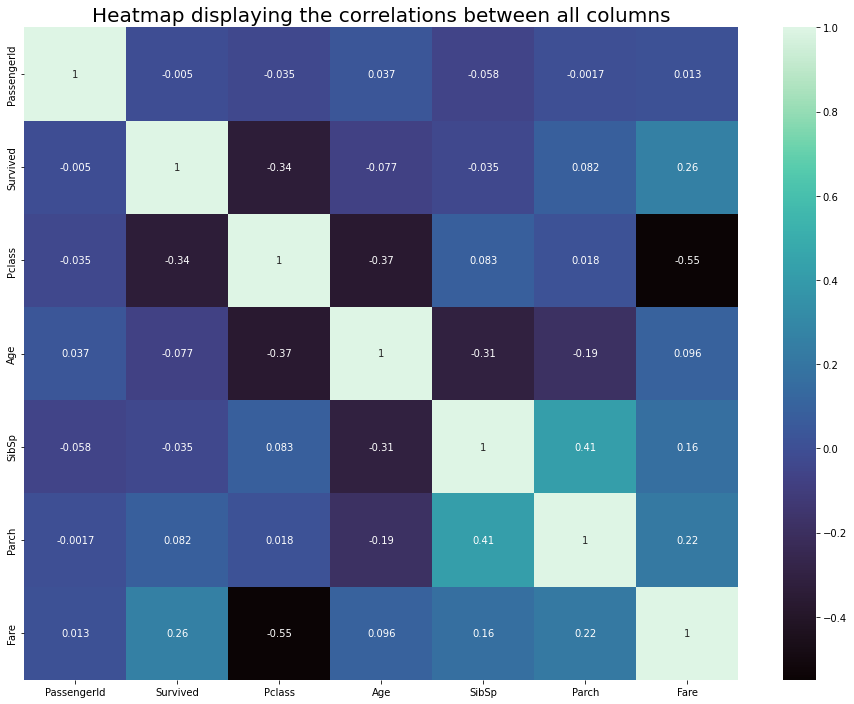

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

correlations = df.corr()

plt.figure(figsize = (16, 12))
plt.title("Heatmap displaying the correlations between all columns", fontsize = 20)
sns.heatmap(correlations, annot = True, cmap = "mako")

#### How much are the columns correlation with our target/pred column **Survived**?

In [14]:
survivedCorr = df.corr()["Survived"]
survivedCorr = pd.DataFrame(survivedCorr)
survivedCorr

,Survived
PassengerId,-0.005007
Survived,1.000000
Pclass,-0.338481
Age,-0.077221
SibSp,-0.035322
Parch,0.081629
Fare,0.257307


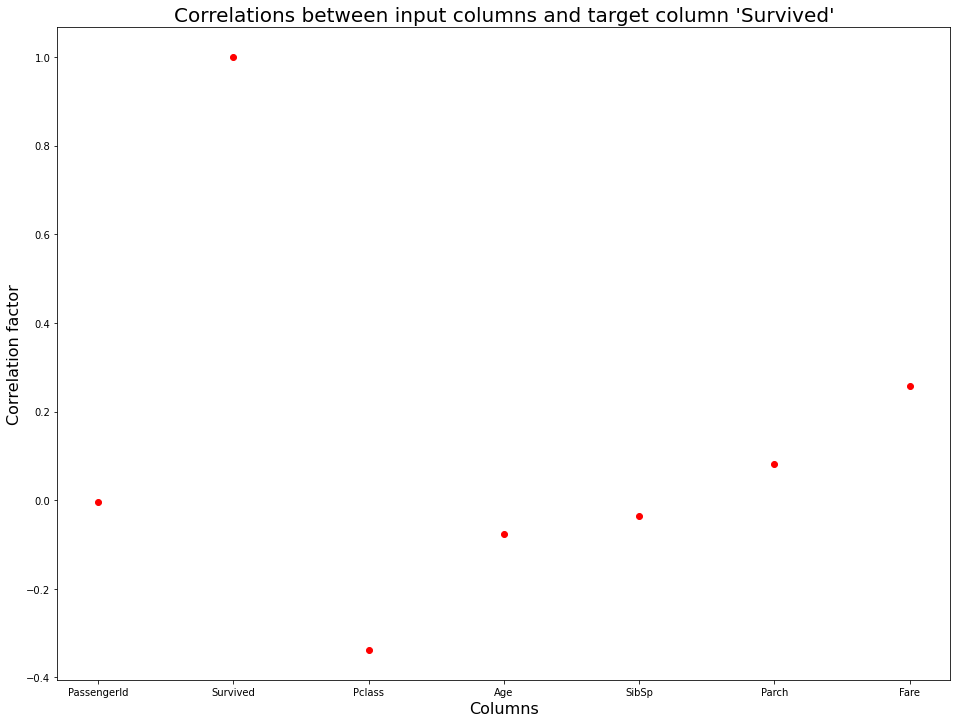

In [15]:
%matplotlib inline

plt.figure(figsize = (16, 12))
plt.title("Correlations between input columns and target column 'Survived'", fontsize = 20)
plt.xlabel("Columns", fontsize = 16)
plt.ylabel("Correlation factor", fontsize = 16)
plt.plot(survivedCorr, color = "red", linestyle = "", marker = "o")
plt.show()

#### How many people died and how many survived?

In [16]:
no = df.value_counts(["Survived"])[0]
yes = df.value_counts(["Survived"])[1]

print(str(no) + " passengers on the Titanic died and " + str(yes) + " people luckily survived.")

549 passengers on the Titanic died and 342 people luckily survived.


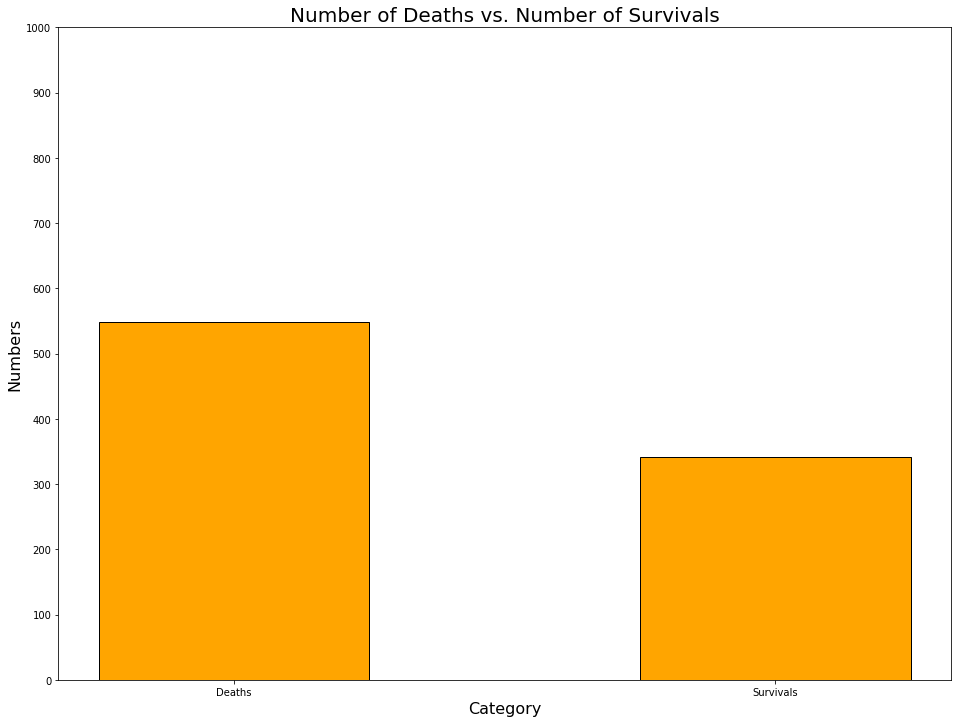

In [17]:
Category = ["Deaths", "Survivals"]

plt.figure(figsize = (16, 12))

plt.title("Number of Deaths vs. Number of Survivals", fontsize = 20)

plt.bar(Category, df.value_counts(["Survived"]), width = 0.5, edgecolor = "k", linewidth = 1, color = "orange")

plt.xlabel("Category", fontsize = 16)
plt.ylabel("Numbers", fontsize = 16)

plt.yticks(ticks=[x * 100 for x in range(11)])

plt.show()

#### How was the Male-Female-Ratio on the Titanic?

In [18]:
men = df.value_counts(["Sex"])[0]
women = df.value_counts(["Sex"])[1]

print("When the Titanic initially took off, there were " + str(men) + " men on board, compared to " + str(women) + " women.")

When the Titanic initially took off, there were 577 men on board, compared to 314 women.


#### How many people of what sex had to die?

In [19]:
pd.crosstab(df["Sex"], df["Survived"]) 

Survived,0,1
Sex,,
female,81,233
male,468,109


<AxesSubplot:title={'center':'Crosstab showing how many Victims were Men/Women'}, xlabel='Survived', ylabel='Sex'>

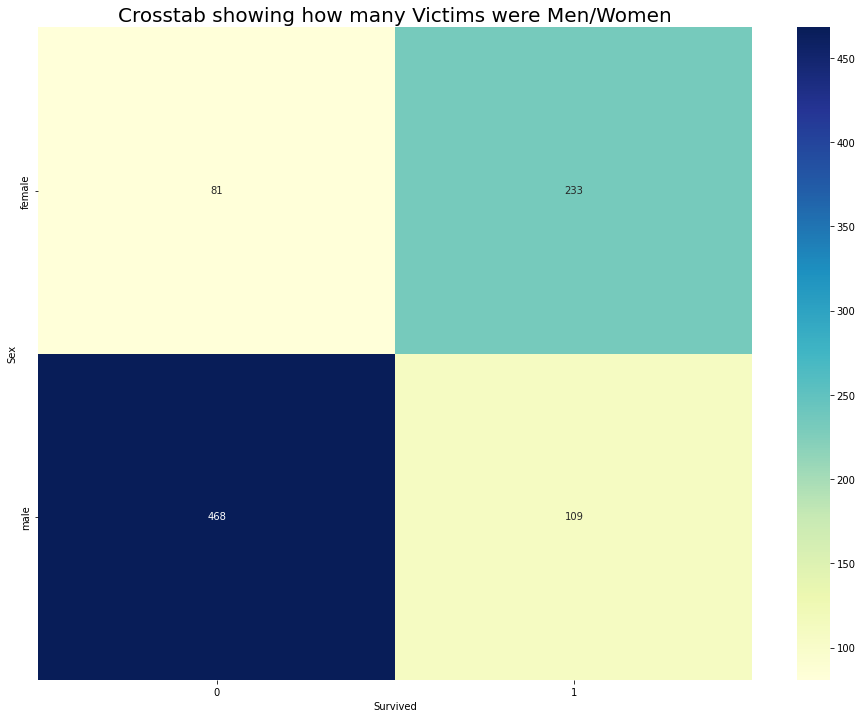

In [20]:
ct = pd.crosstab(df["Sex"], df["Survived"]) 

plt.figure(figsize = (16, 12))
plt.title("Crosstab showing how many Victims were Men/Women", fontsize = 20)
sns.heatmap(ct, cmap = "YlGnBu", annot = True, cbar = True, fmt = "g")

In [21]:
percentage_of_dead_men = (468 * 100) / 577
percentage_of_dead_women = (81 * 100) / 314

percentage_of_dead_men = str(int(percentage_of_dead_men))
percentage_of_dead_women = str(int(percentage_of_dead_women))

print("Of all men on board, " + percentage_of_dead_men + " % died, while only " + percentage_of_dead_women + " % of women did so.")

Of all men on board, 81 % died, while only 25 % of women did so.


#### How many people of what class had to die?

In [22]:
pd.crosstab(df["Pclass"], df["Survived"]) 

Survived,0,1
Pclass,,
1,80,136
2,97,87
3,372,119


<AxesSubplot:title={'center':'Crosstab showing how many Victims each Ship Class counted'}, xlabel='Survived', ylabel='Pclass'>

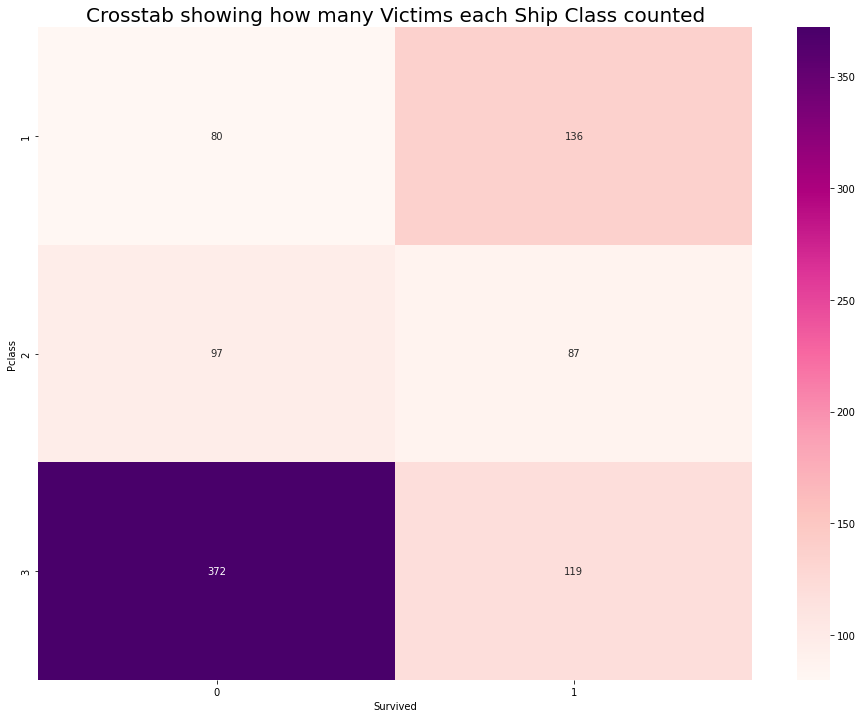

In [23]:
ct = pd.crosstab(df["Pclass"], df["Survived"]) 

plt.figure(figsize = (16, 12))
plt.title("Crosstab showing how many Victims each Ship Class counted", fontsize = 20)
sns.heatmap(ct, cmap = "RdPu", annot = True, cbar = True, fmt = "g")

In [24]:
percOf1stClassDeaths = (80 * 100) / 216
percOf3rdClassDeaths = (372 * 100) / 491

print(percOf1stClassDeaths)
print(percOf3rdClassDeaths)

37.03703703703704
75.76374745417515


It is not much of a surprise that the 1st class suffered only a death rate of little over 37 % and the 3rd class a shocking 76 %.

#### Were people from bigger families more likely to survive than single people or couples?

In [25]:
sibsur = df[["SibSp", "Survived"]].groupby(['SibSp'], as_index = False).mean().sort_values(by = "Survived", ascending = False)
sibsur = pd.DataFrame(sibsur)
sibsur

,SibSp,Survived
1,1,0.535885
2,2,0.464286
0,0,0.345395
3,3,0.250000
4,4,0.166667
5,5,0.000000
6,8,0.000000


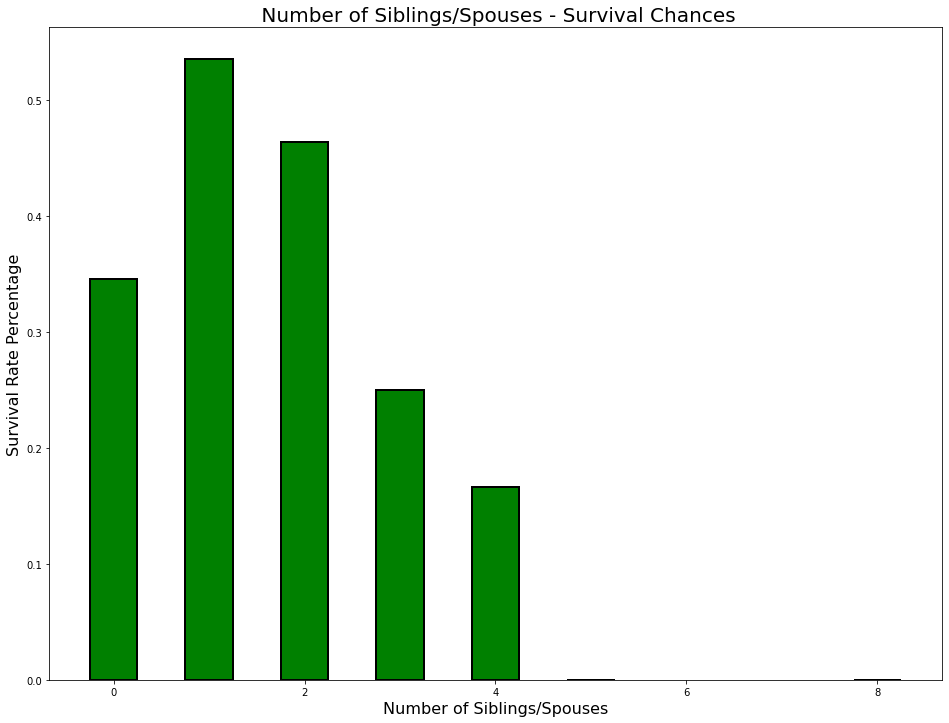

In [26]:
plt.figure(figsize = (16, 12))

plt.title(" Number of Siblings/Spouses - Survival Chances", fontsize = 20)

plt.bar(sibsur["SibSp"], sibsur["Survived"], width = 0.5, edgecolor = "k", linewidth = 2, color = "green")

plt.xlabel("Number of Siblings/Spouses", fontsize = 16)
plt.ylabel("Survival Rate Percentage", fontsize = 16)

plt.show()

As shown above, people with one spouse and/or sibling had the highest chances of survival with percentages decreasing to both sides (more/less siblings and spouses). People with four siblings and/or spouses were less than 20 % likely to survive...

In [27]:
par = df[["Parch", "Survived"]].groupby(["Parch"], as_index = False).mean().sort_values(by = "Survived", ascending = False)
par = pd.DataFrame(par)
par

,Parch,Survived
3,3,0.600000
1,1,0.550847
2,2,0.500000
0,0,0.343658
5,5,0.200000
4,4,0.000000
6,6,0.000000


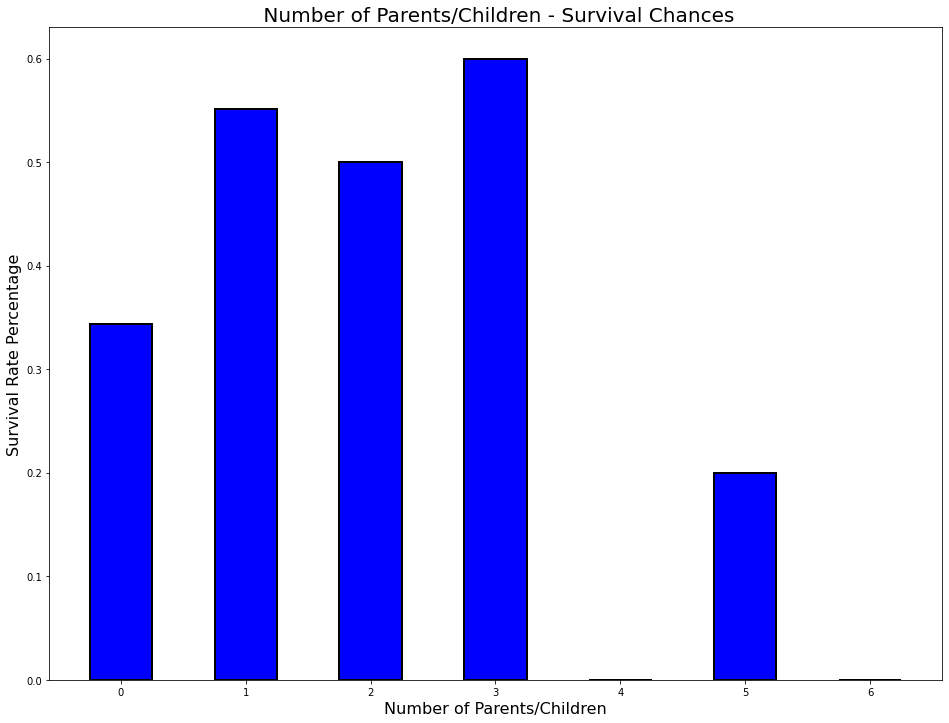

In [28]:
plt.figure(figsize = (16, 12))

plt.title(" Number of Parents/Children - Survival Chances", fontsize = 20)

plt.bar(par["Parch"], par["Survived"], width = 0.5, edgecolor = "k", linewidth = 2, color = "blue")

plt.xlabel("Number of Parents/Children", fontsize = 16)
plt.ylabel("Survival Rate Percentage", fontsize = 16)

plt.show()

Again, people with 1, 2 or 3 parents/children were likely to survive, while children with no parents, couples with no children and people with many children were likely to die.

Condlusion: There is no simple answer to the question who survived and there were certainly special cases but generally speaking, coming from a mid-sized family might have been of great advantage compared to single people or big families.

#### Interactively playing with the data via Profiling

In [29]:
pip install pandas-profiling[notebook]

Note: you may need to restart the kernel to use updated packages.


In [30]:
import pandas_profiling
from pandas_profiling import ProfileReport

profile = ProfileReport(df, title = "Pandas Profiling Report", explorative = True)

profile.to_widgets()

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

## **Predictions**

#### Loading train data

In [31]:
train = pd.read_csv("../input/titanic/train.csv", skipinitialspace = True)
train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


#### Dropping less relevant column

In [32]:
del train["Ticket"]
del train["Name"]

train.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,1,0,3,male,22.0,1,0,7.2500,NaN,S
1,2,1,1,female,38.0,1,0,71.2833,C85,C
2,3,1,3,female,26.0,0,0,7.9250,NaN,S
3,4,1,1,female,35.0,1,0,53.1000,C123,S
4,5,0,3,male,35.0,0,0,8.0500,NaN,S


#### Replacing NAs with 0

In [33]:
train = train.fillna(0)
train.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,1,0,3,male,22.0,1,0,7.2500,0,S
1,2,1,1,female,38.0,1,0,71.2833,C85,C
2,3,1,3,female,26.0,0,0,7.9250,0,S
3,4,1,1,female,35.0,1,0,53.1000,C123,S
4,5,0,3,male,35.0,0,0,8.0500,0,S


#### Replacing categorical values with numeric values

In [34]:
train = train.replace("male", 1)
train = train.replace("female", 2)
train.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,1,0,3,1,22.0,1,0,7.2500,0,S
1,2,1,1,2,38.0,1,0,71.2833,C85,C
2,3,1,3,2,26.0,0,0,7.9250,0,S
3,4,1,1,2,35.0,1,0,53.1000,C123,S
4,5,0,3,1,35.0,0,0,8.0500,0,S


#### Label Encoding

In [35]:
train["Cabin"] = train["Cabin"].astype(str)
train["Embarked"] = train["Embarked"].astype(str)

from sklearn import preprocessing

number = preprocessing.LabelEncoder()

train["Cabin"] = number.fit_transform(train["Cabin"])
train["Embarked"] = number.fit_transform(train["Embarked"])

train.head()

,PassengerId,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,1,0,3,1,22.0,1,0,7.2500,0,3
1,2,1,1,2,38.0,1,0,71.2833,82,1
2,3,1,3,2,26.0,0,0,7.9250,0,3
3,4,1,1,2,35.0,1,0,53.1000,56,3
4,5,0,3,1,35.0,0,0,8.0500,0,3


#### Choosing X and y

In [36]:
from sklearn.model_selection import train_test_split

X = train.drop(["Survived"], axis = 1)
y = train["Survived"]

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0, test_size = 0.1)

#### Loading test data

In [37]:
test = pd.read_csv("../input/titanic/test.csv", skipinitialspace = True)
test.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


In [38]:
test.shape

(418, 11)

#### Dropping less relevant column

In [39]:
del test["Ticket"]
del test["Name"]

test.head()

,PassengerId,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,892,3,male,34.5,0,0,7.8292,NaN,Q
1,893,3,female,47.0,1,0,7.0000,NaN,S
2,894,2,male,62.0,0,0,9.6875,NaN,Q
3,895,3,male,27.0,0,0,8.6625,NaN,S
4,896,3,female,22.0,1,1,12.2875,NaN,S


#### Replacing NAs with 0

In [40]:
test = test.fillna(0)
test.head()

,PassengerId,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,892,3,male,34.5,0,0,7.8292,0,Q
1,893,3,female,47.0,1,0,7.0000,0,S
2,894,2,male,62.0,0,0,9.6875,0,Q
3,895,3,male,27.0,0,0,8.6625,0,S
4,896,3,female,22.0,1,1,12.2875,0,S


#### Replacing categorical values with numeric values

In [41]:
test = test.replace("male", 1)
test = test.replace("female", 2)
test.head()

,PassengerId,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,892,3,1,34.5,0,0,7.8292,0,Q
1,893,3,2,47.0,1,0,7.0000,0,S
2,894,2,1,62.0,0,0,9.6875,0,Q
3,895,3,1,27.0,0,0,8.6625,0,S
4,896,3,2,22.0,1,1,12.2875,0,S


#### Label Encoding

In [42]:
test["Cabin"] = test["Cabin"].astype(str)
test["Embarked"] = test["Embarked"].astype(str)

from sklearn import preprocessing

number = preprocessing.LabelEncoder()

test["Cabin"] = number.fit_transform(test["Cabin"])
test["Embarked"] = number.fit_transform(test["Embarked"])

test.head()

,PassengerId,Pclass,Sex,Age,SibSp,Parch,Fare,Cabin,Embarked
0,892,3,1,34.5,0,0,7.8292,0,1
1,893,3,2,47.0,1,0,7.0000,0,2
2,894,2,1,62.0,0,0,9.6875,0,1
3,895,3,1,27.0,0,0,8.6625,0,2
4,896,3,2,22.0,1,1,12.2875,0,2


### **Machine Learning Models**

#### **Logistic Regression**

In [43]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(solver = "saga", max_iter = 10000)
model.fit(X_train, y_train)

LogisticRegression(max_iter=10000, solver='saga')

In [44]:
model.score(X_test, y_test)

0.8

#### **Random Forest**

In [45]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(criterion = "entropy")
model.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy')

In [46]:
model.score(X_test, y_test)

0.8333333333333334

#### **Decision Tree**

In [47]:
from sklearn.tree import DecisionTreeClassifier

model = DecisionTreeClassifier(criterion = "entropy")
model.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy')

In [48]:
print(model.score(X_test, y_test))

0.7555555555555555


#### **SVM with RBF-Kernel**

In [49]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [50]:
from sklearn.svm import SVC

model = SVC(kernel = "rbf", gamma = 0.015, C = 10)
model.fit(X_train, y_train)

SVC(C=10, gamma=0.015)

In [51]:
model.score(X_test, y_test)

0.8333333333333334

#### **Gaussian Naive Bayes**

In [52]:
from sklearn.naive_bayes import GaussianNB

model = GaussianNB()
model.fit(X_train, y_train)

GaussianNB()

In [53]:
model.score(X_test, y_test)

0.8333333333333334

#### **KNN**

In [54]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors = 13)
model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=13)

In [55]:
model.score(X_test, y_test)

0.8555555555555555

#### **Logistic Regression with scaled data**

In [56]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(solver = "sag", max_iter = 10000)
model.fit(X_train, y_train)

LogisticRegression(max_iter=10000, solver='sag')

In [57]:
model.score(X_test, y_test)

0.8444444444444444

### **Metrics for Machine Learning**

#### Validation Curve

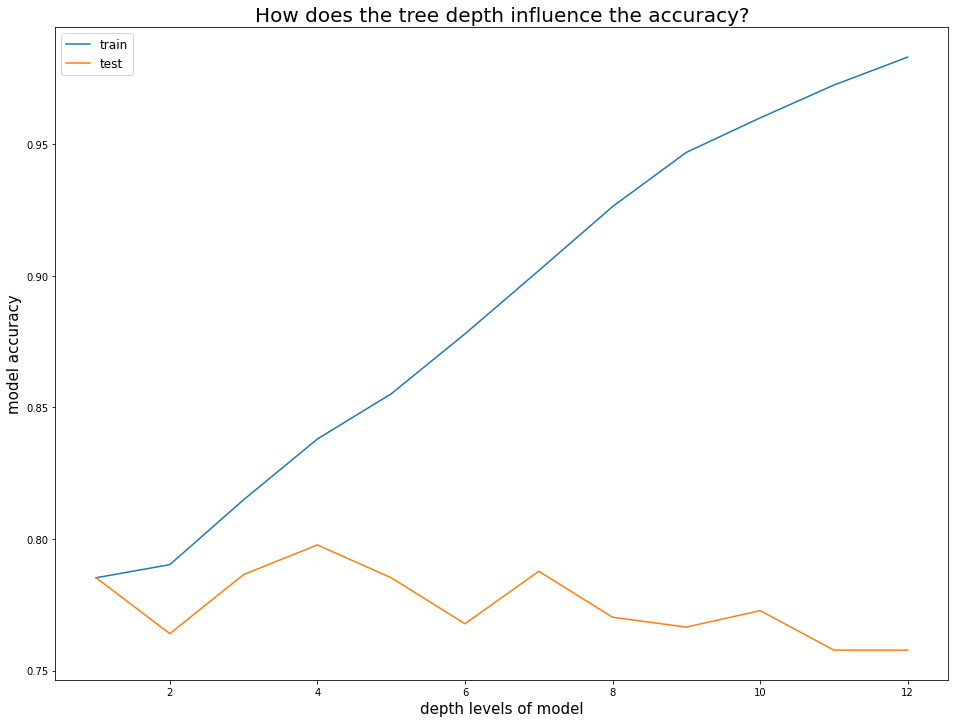

In [58]:
from sklearn.model_selection import validation_curve
from sklearn.tree import DecisionTreeClassifier
import numpy as np

param_range = np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])

train_scores, test_scores = validation_curve(DecisionTreeClassifier(), X_train, y_train, param_name = "max_depth", param_range = param_range)

%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (16, 12))

plt.plot(param_range, np.mean(train_scores, axis = 1))
plt.plot(param_range, np.mean(test_scores, axis = 1))

plt.title("How does the tree depth influence the accuracy?", fontsize = 20)
plt.xlabel("depth levels of model", fontsize = 15)
plt.ylabel("model accuracy", fontsize = 15)

# Adding a legend
plt.legend(["train", "test"], loc = "upper left", fontsize = 12)

plt.show()

#### Confusion Matrix

|                   | Model: Not True | Model: True    |
|-------------------|-----------------|----------------|
| Reality: Not True | True negative   | False positive |
| Reality: True     | False negative  | True positive  |

In [59]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [60]:
model.score(X_test, y_test)

0.8444444444444444

In [61]:
y_test_pred = model.predict(X_test)

In [62]:
# Predicted y values
print(y_test_pred)

[0 0 0 1 1 1 1 1 0 1 0 1 0 1 1 1 0 0 0 0 0 1 0 0 1 1 0 1 1 0 0 1 0 1 0 0 0
 0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 1 0 1 0 0 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 0 0
 0 1 0 0 0 0 0 0 1 0 0 1 1 0 1 1]


In [63]:
# Real y values
y_test = list(y_test)
print(y_test)

[0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0]


In [64]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_test, y_test_pred)

array([[45,  6],
       [ 8, 31]])

#### Learning Curve

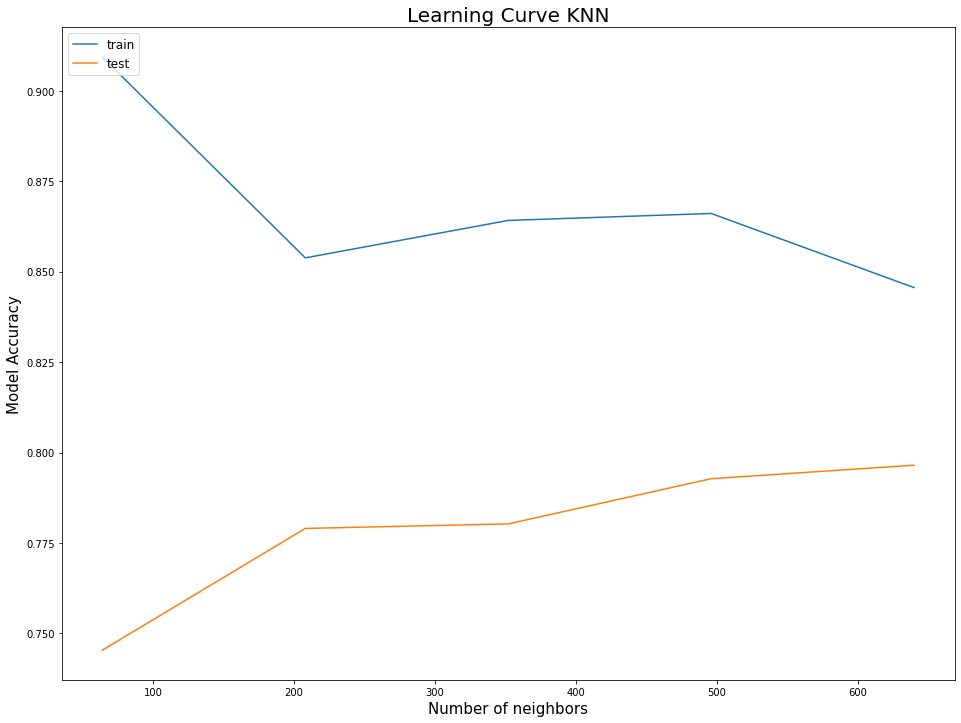

In [65]:
from sklearn.model_selection import learning_curve
from sklearn.neighbors import KNeighborsClassifier
from sklearn.utils import shuffle

X_train, y_train = shuffle(X_train, y_train)

import numpy as np

train_sizes_abs, train_scores, test_scores = learning_curve(KNeighborsClassifier(), X_train, y_train)

%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (16, 12))

plt.plot(train_sizes_abs, np.mean(train_scores, axis = 1))
plt.plot(train_sizes_abs, np.mean(test_scores, axis = 1))

plt.title("Learning Curve KNN", fontsize = 20)
plt.xlabel("Number of neighbors", fontsize = 15)
plt.ylabel("Model Accuracy", fontsize = 15)

# Adding a legend
plt.legend(["train", "test"], loc = "upper left", fontsize = 12)

plt.show()

#### ROC Curve

In [66]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [67]:
model.score(X_test, y_test)

0.8444444444444444

In [68]:
model.predict(X_test)

array([0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0,
       1, 1])

In [69]:
model.predict_proba(X_test)[:, 1] # Only probability that model predicts Yes/True

array([0.19131541, 0.14318534, 0.05707477, 0.95514364, 0.64803721,
       0.53552317, 0.92084532, 0.93473501, 0.45489714, 0.76124715,
       0.07676225, 0.722253  , 0.16481476, 0.80913232, 0.95083324,
       0.6458794 , 0.10299648, 0.17234426, 0.08577414, 0.18098849,
       0.21359845, 0.91536729, 0.16463418, 0.45416478, 0.61604777,
       0.94495882, 0.08972885, 0.61494988, 0.76685949, 0.4880811 ,
       0.11904424, 0.68646832, 0.09569591, 0.56996526, 0.07321289,
       0.45726949, 0.07563509, 0.1865031 , 0.19522876, 0.13096089,
       0.29980975, 0.13309706, 0.14542353, 0.04483857, 0.90319645,
       0.14344233, 0.14329238, 0.93469074, 0.16135855, 0.40560145,
       0.6177972 , 0.59465547, 0.77928549, 0.10888994, 0.64006499,
       0.14406163, 0.33376885, 0.38782168, 0.05734201, 0.10707369,
       0.13909257, 0.55100106, 0.91176784, 0.54156998, 0.57541171,
       0.10401392, 0.90110503, 0.18843863, 0.78630185, 0.90992274,
       0.72805946, 0.30541784, 0.38841105, 0.14349758, 0.10038

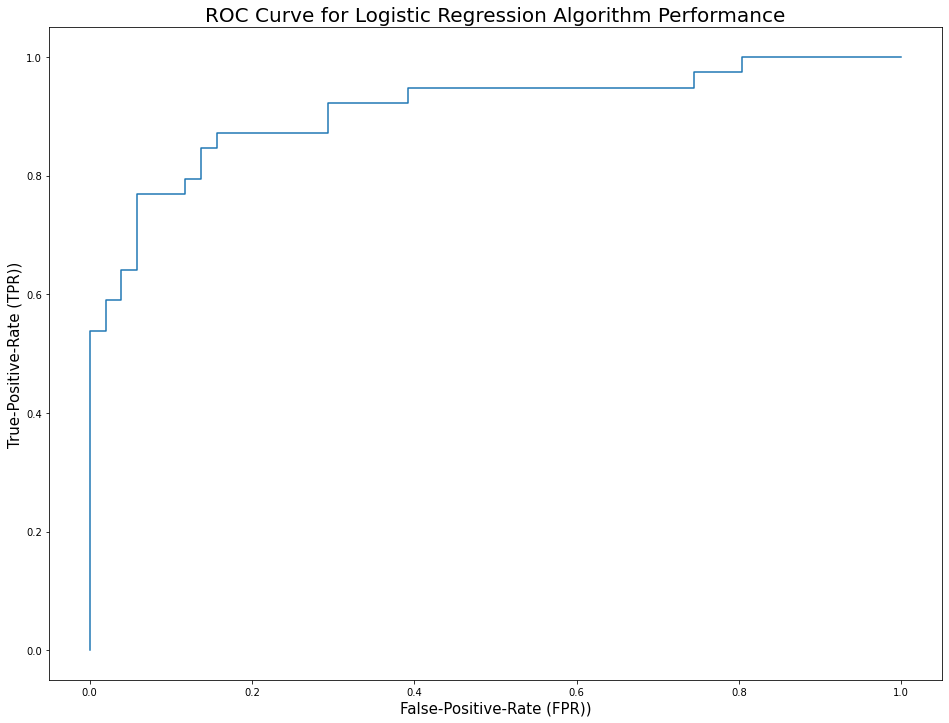

In [70]:
y_test_pred = model.predict_proba(X_test)[:, 1]

from sklearn.metrics import roc_curve, roc_auc_score

fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (16, 12))

plt.plot(fpr, tpr)

plt.title("ROC Curve for Logistic Regression Algorithm Performance", fontsize = 20)
plt.xlabel("False-Positive-Rate (FPR))", fontsize = 15)
plt.ylabel("True-Positive-Rate (TPR))", fontsize = 15)

plt.show()

In [71]:
# Area under the curve
roc_auc_score(y_test, y_test_pred)

0.9105077928607341

#### 1. Run model

In [72]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors = 13)
model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=13)

In [73]:
pred = model.predict(test)

# Append new column named 'Survived' as stated in the Submission Rules
test["Survived"] = pred

submission = test[["PassengerId", "Survived"]]

submission.to_csv("seschlbeck_prediction_titanic.csv", index = False)